In [12]:
import plotly.io as pio
pio.renderers.default = "plotly_mimetype+notebook_connected"

import warnings
warnings.simplefilter('ignore')

import logging
logging.getLogger('statsforecast').setLevel(logging.ERROR)

In [36]:
# import pandas
import numpy as np
import pandas as pd

import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
plt.style.use('fivethirtyeight')
plt.rcParams['lines.linewidth'] = 1.5
dark_style = {
    'figure.facecolor': '#212946',
    'axes.facecolor': '#212946',
    'savefig.facecolor':'#212946',
    'axes.grid': True,
    'axes.grid.which': 'both',
    'axes.spines.left': False,
    'axes.spines.right': False,
    'axes.spines.top': False,
    'axes.spines.bottom': False,
    'grid.color': '#2A3459',
    'grid.linewidth': '1',
    'text.color': '0.9',
    'axes.labelcolor': '0.9',
    'xtick.color': '0.9',
    'ytick.color': '0.9',
    'font.size': 12 }
# plt.rcParams.update(dark_style)

from pylab import rcParams
rcParams['figure.figsize'] = (18,7)
from statsforecast import StatsForecast


In [14]:
def read_data(data_path):
    df = pd.read_csv(data_path)
    final = pd.DataFrame()
    final['ds'] = pd.to_datetime(df['date'])
    final['y'] = df['load_data']
    final['unique_id'] = 'load_data'
    return final
path = 'final_output.csv'

In [15]:
load_df = read_data(path)
holiday_df = pd.read_csv('../Holidays_Data/holidays.csv')

In [16]:
holiday_df.head()

,Date,Name,Type,Day
0,2022-01-01,New Year's Day,Restricted Holiday,Saturday
1,2022-01-09,Guru Govind Singh Jayanti,Restricted Holiday,Sunday
2,2022-01-13,Lohri,Restricted Holiday,Thursday
3,2022-01-14,Pongal,Restricted Holiday,Friday
4,2022-01-26,Republic Day,Gazetted Holiday,Wednesday


In [17]:
# link the holiday dataframe to the load dataframe by date not timestamp
load_df['Date'] = load_df['ds'].dt.date
holiday_df['Date'] = pd.to_datetime(holiday_df['Date'])
holiday_df['Date'] = holiday_df['Date'].dt.date
# merge the two dataframes
load_df = pd.merge(load_df, holiday_df, on='Date', how='left')


In [18]:
# find the first five rows whre name is not null
load_df[load_df['Name'].notnull()].head(100)

,ds,y,unique_id,Date,Name,Type,Day
95,2022-04-02 00:00:00,13.39,load_data,2022-04-02,Chaitra Sukhladi,Restricted Holiday,Saturday
96,2022-04-02 00:15:00,13.08,load_data,2022-04-02,Chaitra Sukhladi,Restricted Holiday,Saturday
97,2022-04-02 00:30:00,12.35,load_data,2022-04-02,Chaitra Sukhladi,Restricted Holiday,Saturday
98,2022-04-02 00:45:00,8.73,load_data,2022-04-02,Chaitra Sukhladi,Restricted Holiday,Saturday
99,2022-04-02 01:00:00,10.18,load_data,2022-04-02,Chaitra Sukhladi,Restricted Holiday,Saturday
...,...,...,...,...,...,...,...
190,2022-04-02 23:45:00,20.08,load_data,2022-04-02,Chaitra Sukhladi,Restricted Holiday,Saturday
863,2022-04-10 00:00:00,10.52,load_data,2022-04-10,Rama Navami,Restricted Holiday,Sunday
864,2022-04-10 00:15:00,8.66,load_data,2022-04-10,Rama Navami,Restricted Holiday,Sunday
865,2022-04-10 00:30:00,9.42,load_data,2022-04-10,Rama Navami,Restricted Holiday,Sunday


In [19]:
# get the type of holiday list
types = load_df['Type'].unique()
types

array([nan, 'Restricted Holiday', 'Observance, Christian',
       'Gazetted Holiday', 'Observance', 'Season', 'Observance, Hinduism'],
      dtype=object)

In [20]:
# is holiday or not - if holiday then 1 else 0 
load_df['is_holiday'] = load_df['Name'].notnull()

In [21]:
# is_holiday is a boolean column, convert it to int
load_df['is_holiday'] = load_df['is_holiday'].astype(int)
load_df['is_weekend'] = load_df['ds'].dt.dayofweek.apply(lambda x: 1 if x in [5,6] else 0)


In [22]:
load_df['ds'].dt.dayofweek

0        4
1        4
2        4
3        4
4        4
        ..
49627    3
49628    3
49629    3
49630    3
49631    4
Name: ds, Length: 49632, dtype: int32

In [23]:
load_df.head()

,ds,y,unique_id,Date,Name,Type,Day,is_holiday,is_weekend
0,2022-04-01 00:15:00,16.07,load_data,2022-04-01,NaN,NaN,NaN,0,0
1,2022-04-01 00:30:00,13.75,load_data,2022-04-01,NaN,NaN,NaN,0,0
2,2022-04-01 00:45:00,13.13,load_data,2022-04-01,NaN,NaN,NaN,0,0
3,2022-04-01 01:00:00,10.36,load_data,2022-04-01,NaN,NaN,NaN,0,0
4,2022-04-01 01:15:00,9.96,load_data,2022-04-01,NaN,NaN,NaN,0,0


In [29]:
load_df['is_holiday'].value_counts()

is_holiday
0    41664
1     7968
Name: count, dtype: int64

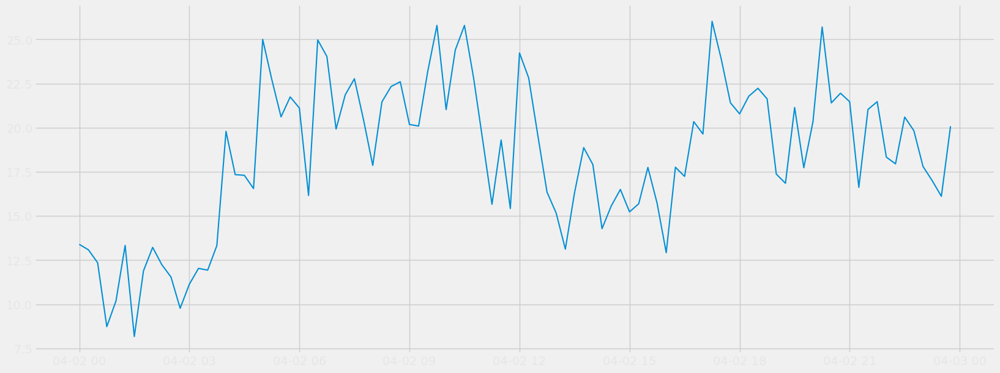

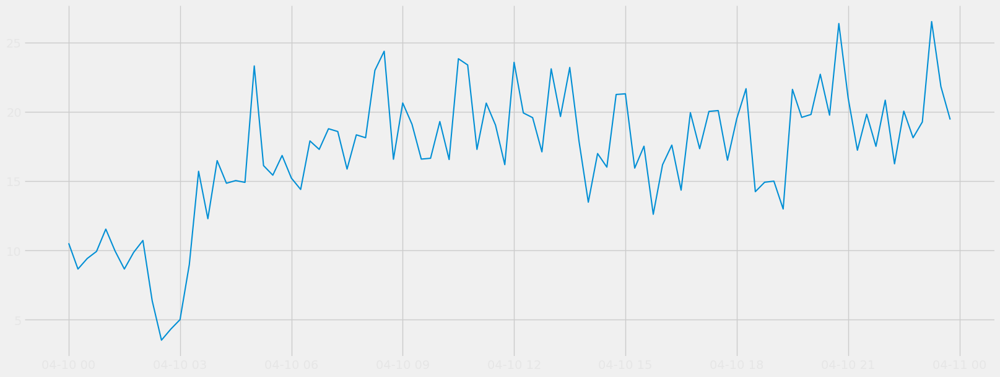

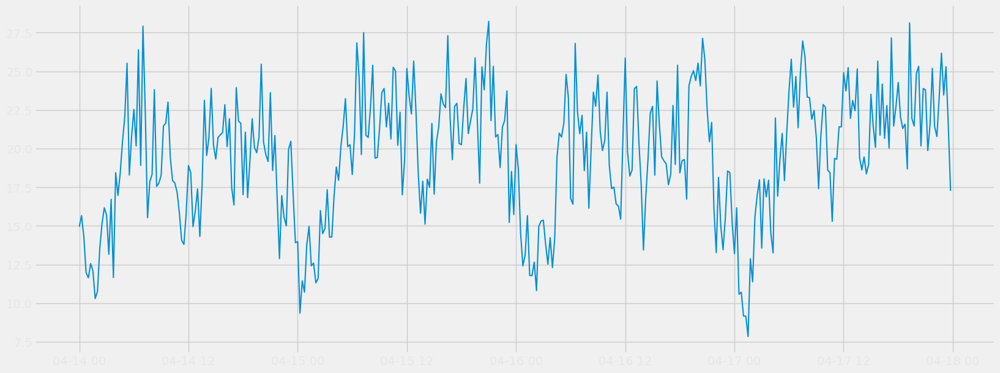

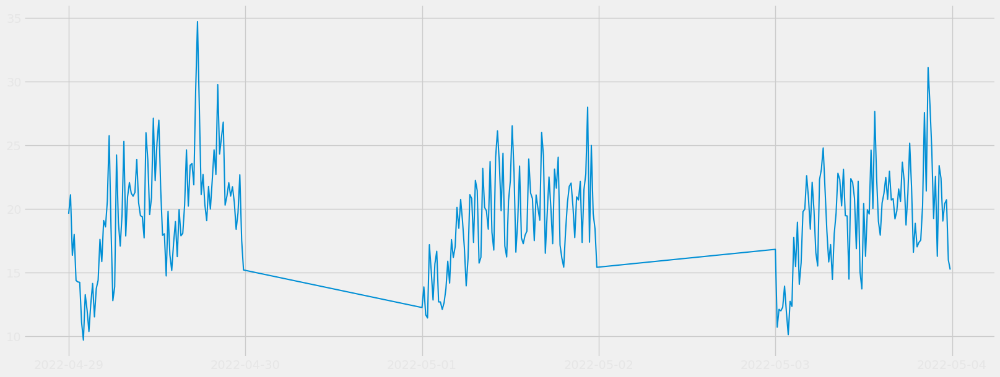

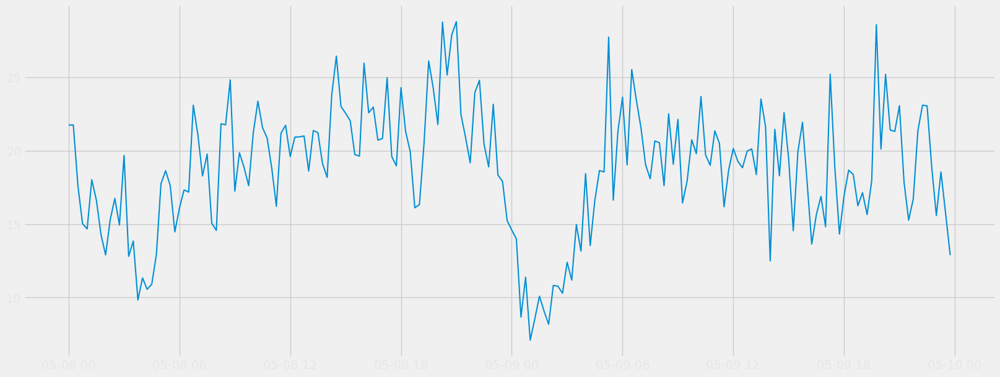

...

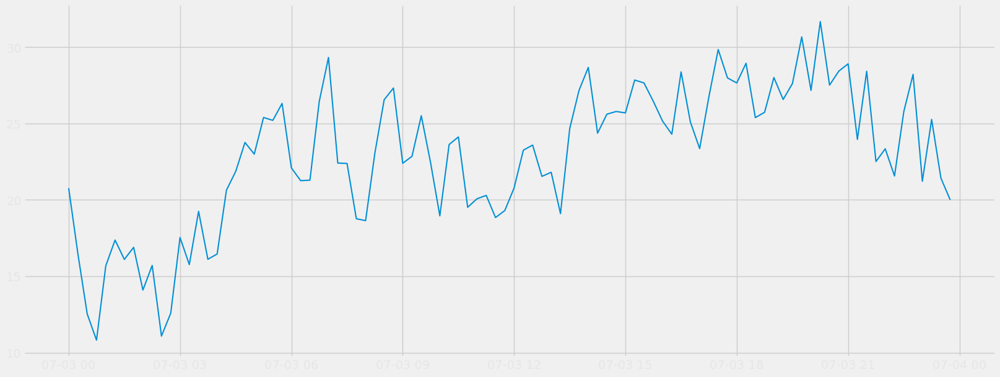

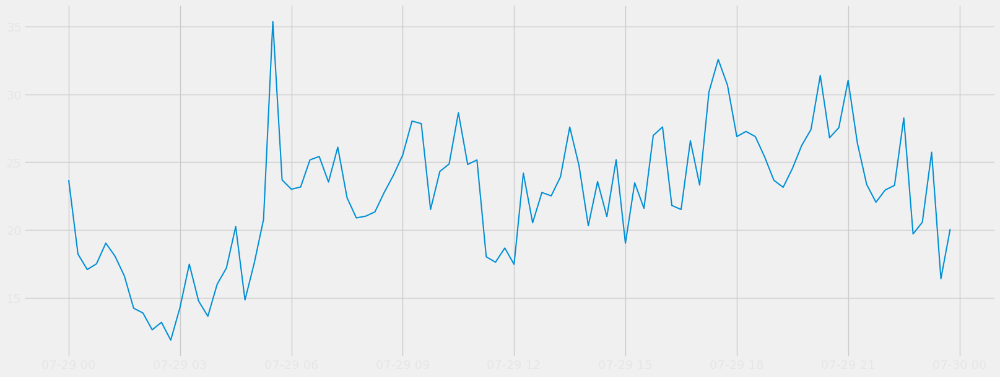

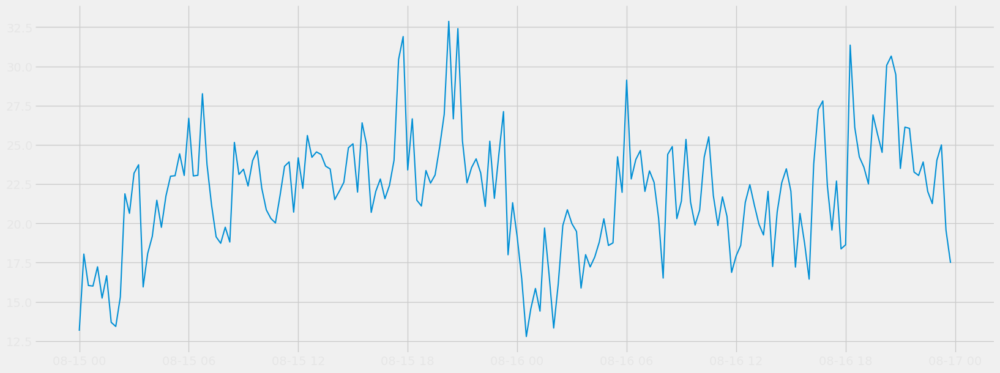

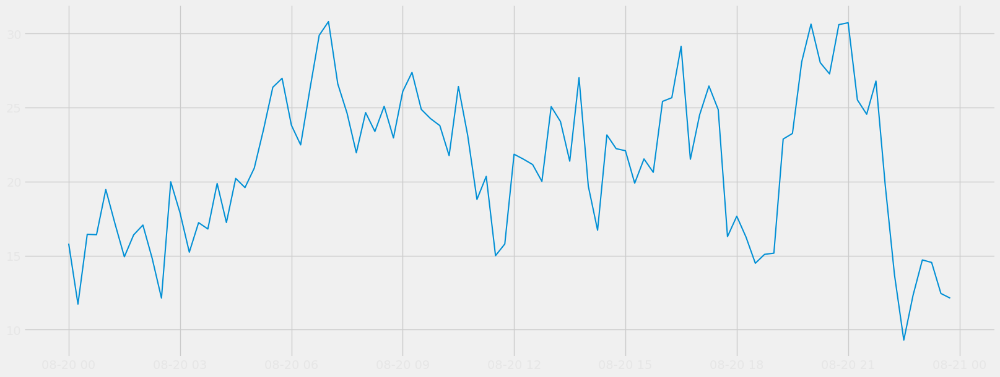

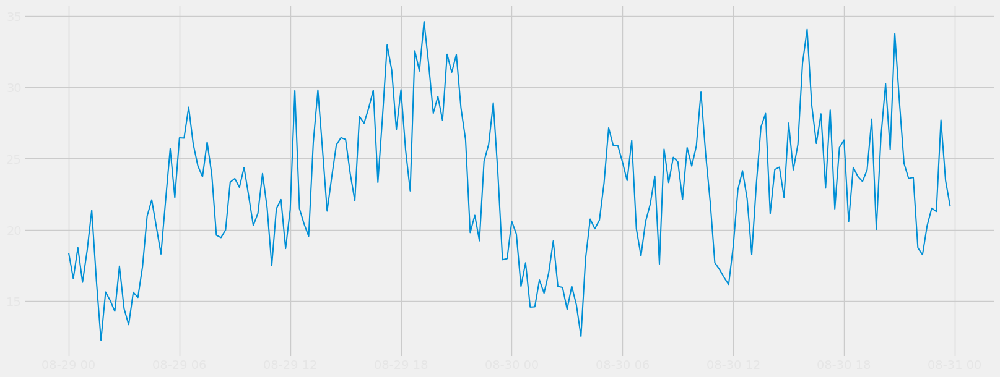

In [49]:
# scatter plot the load if is_holiday is 1
data = load_df[load_df['is_holiday'] == 1]
data.ds = pd.to_datetime(data.ds)


# get the break points and split the data into multiple dataframes
# plot each dataframe separately with a different color
# get the break points
break_points = data['ds'].diff().dt.days > 1
break_points = break_points.cumsum()
# split the data into multiple dataframes
data = data.groupby(break_points)
# plot each dataframe separately in separate plots with different colors
for name, group in data:
    plt.plot(group['ds'], group['y'], label=name)
    plt.show( )

In [24]:
 
# Define a function to determine the color
def get_color(row):
    if row['is_holiday'] and row['is_weekend']:
        return 'y'
    elif row['is_holiday']:
        return 'g'
    elif row['is_weekend']:
        return 'r'
    else:
        return 'b'

 

In [25]:
def plot_figure(df):
    # Apply the function to each row
    df['color'] = df.apply(get_color, axis=1).astype(str)
    for color in df['color'].unique(): 
        plt.plot(df['ds'], df['y'] , color= color)
    plt.show()

In [26]:
def plot_figure(df, title):
    df['color'] = df.apply(get_color, axis=1)
    plt.figure(figsize=(20,7))
    # line plot with different color for each type of holiday
    for color in df['color'].unique():
        plt.plot(df['ds'][df['color'] == color], df['y'][df['color'] == color], color=color)
    plt.title(title)
    plt.show()

In [39]:
import plotly.graph_objects as go

# Define a function to determine the label
def get_label(row):
    if row['is_weekend']:
        return 'cyan'
    else:
        return 'brown'

# Apply the function to each row
load_df['label'] = load_df.apply(get_label, axis=1)
# adjusting marker size
load_df['marker_size'] = load_df['is_holiday'].apply(lambda x: 1 if x else 0)
# Create a line plot
fig = go.Figure(data=go.Scatter(x=load_df['ds'], y=load_df['y'], mode='lines+markers',  marker_size=load_df['marker_size']))

fig.show()

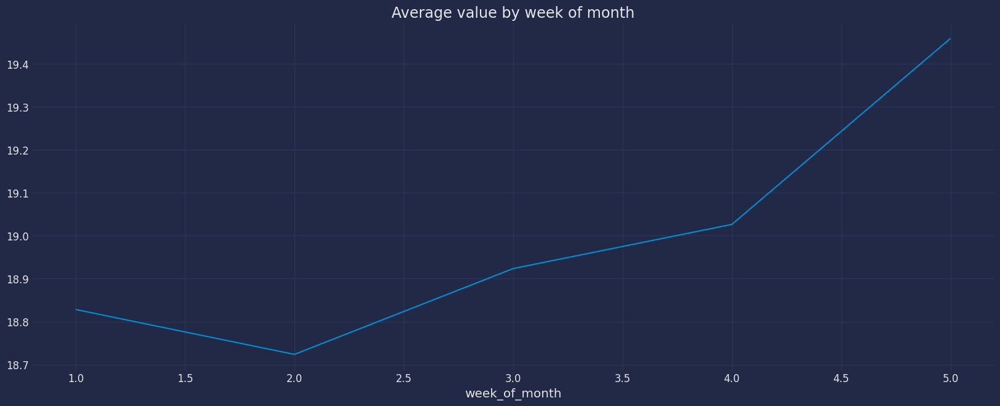

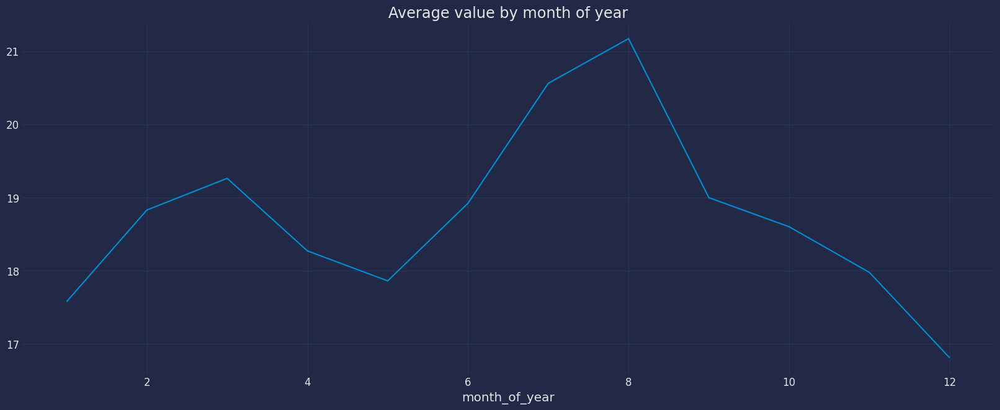

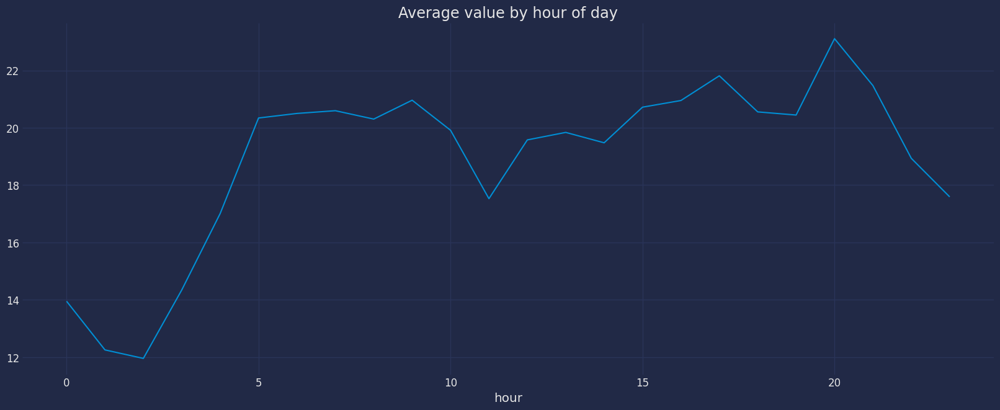

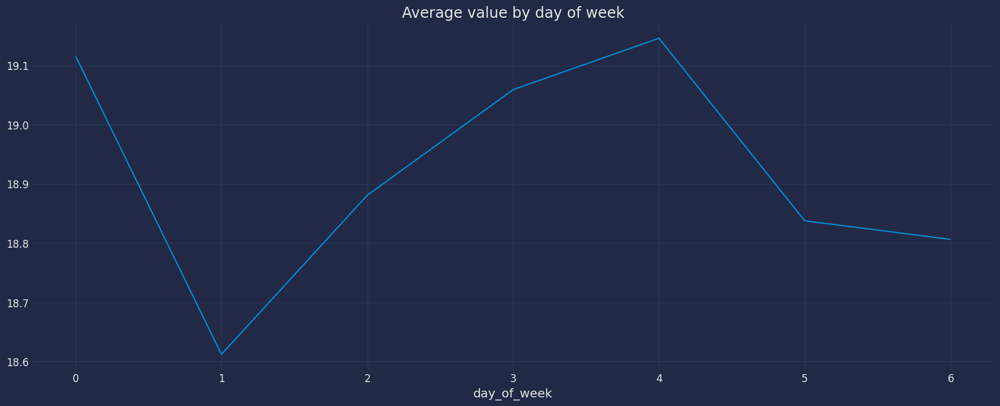

In [116]:
import matplotlib.pyplot as plt

# Assume df is your DataFrame, 'timestamp' is your date column, and 'value' is your time series data
load_df['hour'] = load_df['ds'].dt.hour
load_df['day_of_week'] = load_df['ds'].dt.dayofweek
# week of month
load_df['week_of_month'] = load_df['ds'].apply(lambda d: (d.day-1) // 7 + 1)
# week 
load_df.groupby('week_of_month')['y'].mean().plot()
plt.title('Average value by week of month')
plt.show()

# month of year
load_df['month_of_year'] = load_df['ds'].dt.month
load_df.groupby('month_of_year')['y'].mean().plot()
plt.title('Average value by month of year')
plt.show()

# Check for daily seasonality
load_df.groupby('hour')['y'].mean().plot()
plt.title('Average value by hour of day')
plt.show()

# Check for weekly seasonality
load_df.groupby('day_of_week')['y'].mean().plot()
plt.title('Average value by day of week')
plt.show()

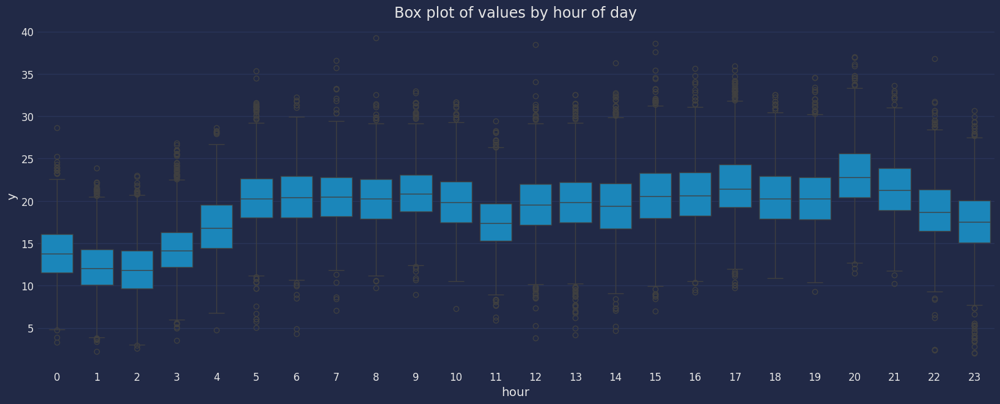

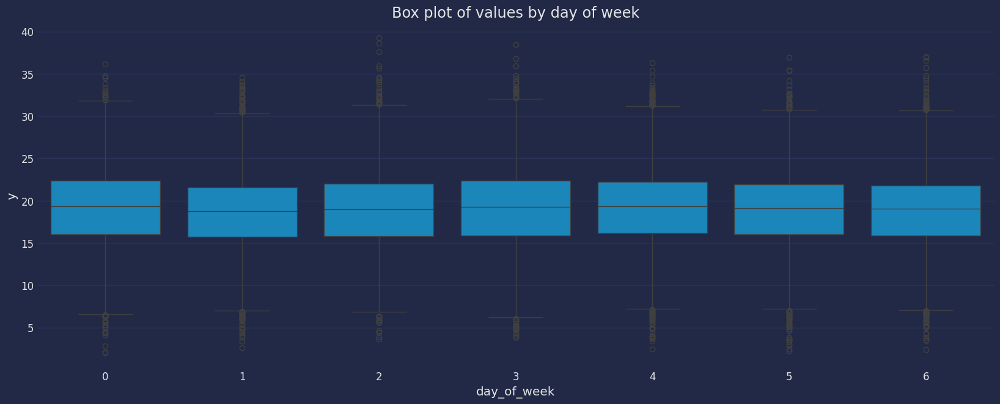

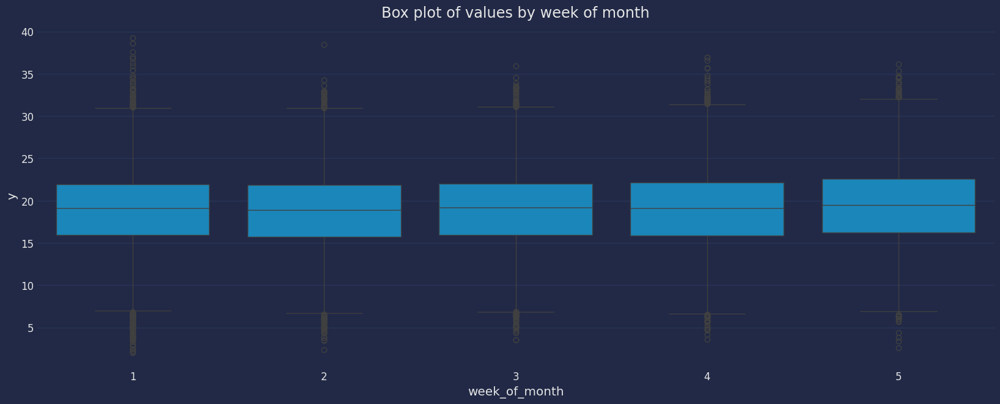

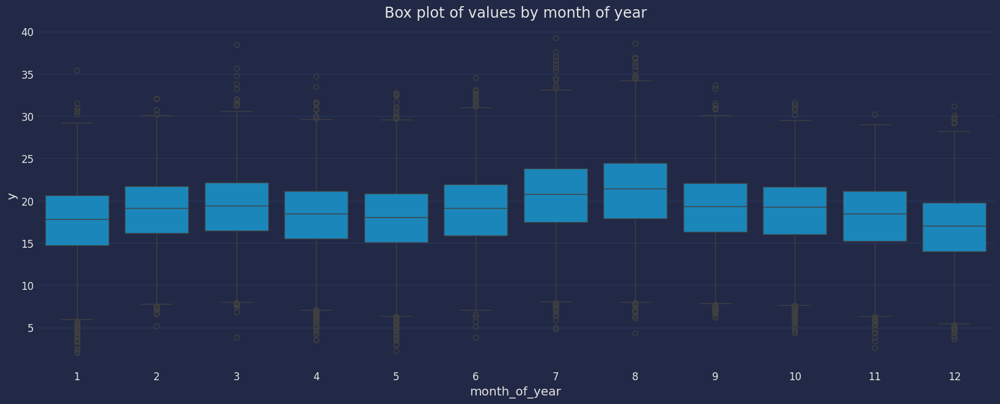

In [117]:
import seaborn as sns

# Box plot for hour of day
sns.boxplot(x='hour', y='y', data=load_df)
plt.title('Box plot of values by hour of day')
plt.show()

# Box plot for day of week
sns.boxplot(x='day_of_week', y='y', data=load_df)
plt.title('Box plot of values by day of week')
plt.show()

# Box plot for week of month
sns.boxplot(x='week_of_month', y='y', data=load_df)
plt.title('Box plot of values by week of month')
plt.show()

# Box plot for month of year
sns.boxplot(x='month_of_year', y='y', data=load_df)
plt.title('Box plot of values by month of year')
plt.show()

### Evaluation


In [147]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt
import numpy as np
import statsmodels.api as sm

def calculate_metrics(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = sqrt(mse)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    mda = np.mean((np.sign(y_true[1:] - y_true[:-1]) == np.sign(y_pred[1:] - y_pred[:-1])).astype(int))
    
    # Fit the model to calculate AIC and BIC
    model = sm.OLS(y_true, sm.add_constant(y_pred))
    results = model.fit()
    aic = results.aic
    bic = results.bic
    # create df with each of the columns metrics
    metrics = {'model_name': [model_name], 'mae': [mae], 'mse': [mse], 'rmse': [rmse], 'mape': [mape], 'mda': [mda], 'aic': [aic], 'bic': [bic]}
    print(f'MAE: {mae}')
    print(f'MSE: {mse}')
    print(f'RMSE: {rmse}')
    print(f'MAPE: {mape}')
    print(f'MDA: {mda}')
    print(f'AIC: {aic}')
    print(f'BIC: {bic}')
    return metrics
# fun to go through each model and calculate metrics 
def print_metrics(eval_df):
    for model_name in eval_df['model_name'].unique():
        print(f'Metrics for {model_name}')
        print('--------------------------------')
        metrics_df = eval_df[eval_df['model_name'] == model_name]
        metrics_df = metrics_df.drop('model_name', axis=1)
        metrics_df = metrics_df.reset_index(drop=True)
        display(metrics_df)
        print('--------------------------------')
        print('\n')
def get_metrics(df, model_name):
    #############################
    # df -- ds and y and model_predition_y for each model
    # return -- eval_df
    y_true = df['original_y']
    y_pred = df[f'{model_name}_y']
    # print(y_pred)
    metrics = calculate_metrics(y_true, y_pred, model_name)
    return metrics
def get_all_metrics(df):
    new_df = pd.DataFrame()
    for column in df.columns.tolist():
        if (column != 'y') and (column != 'ds'):
            # append the metrics to the new_df
            model_name = column.split('_')[0]
            pd.concat([new_df, pd.DataFrame(get_metrics(df, model_name))], ignore_index=True)
    return new_df

In [148]:
# model evaluation df
eval_df = pd.DataFrame()
eval_df['ds'] = load_df['ds']   
eval_df['original_y'] = load_df['y']

In [149]:

# Assume df is your DataFrame and 'value' is the column with the time series data
eval_df['naiveforecast_y'] = load_df['y'].shift(1)

# Drop the first row as it has no previous value to make a forecast
eval_df = eval_df.dropna()


final = get_all_metrics(eval_df) 

MAE: 0.0
MSE: 0.0
RMSE: 0.0
MAPE: 0.0
MDA: 0.9999597026052266
AIC: -3036248.5667193085
BIC: -3036230.9419774734
MAE: 2.529676585843525
MSE: 10.3065730481553
RMSE: 3.2103851868826117
MAPE: 13.983395663492153
MDA: 0.9999597026052266
AIC: 250336.26407820024
BIC: 250353.8888200352


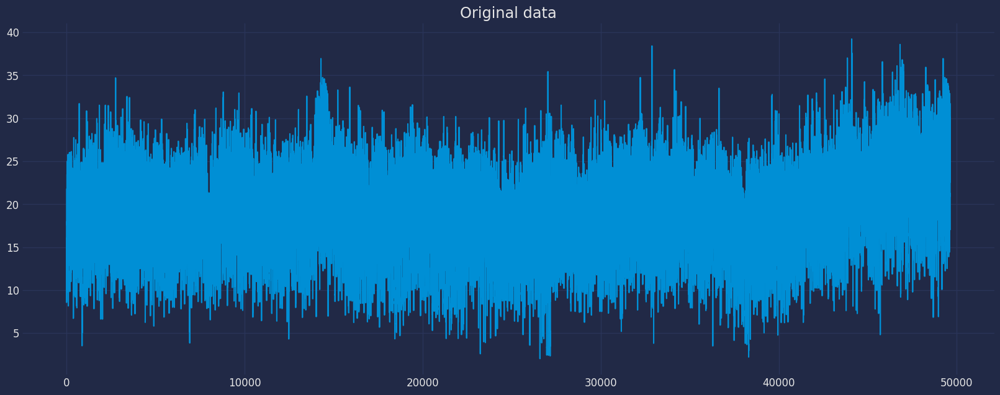

ADF Statistic: -24.203192
p-value: 0.000000


In [150]:
# check for stationarity of the data -- constant mean and variance and no seasonality
# Augmented Dickey-Fuller test
from statsmodels.tsa.stattools import adfuller
load_df['y'].plot()
plt.title('Original data')
plt.show()
# ADF Test
result = adfuller(load_df['y'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
# p-value > 0.05, data is not stationary



In [113]:


# Example usage:
y_true = np.array([3, -0.5, 2, 7])
y_pred = np.array([2.5, 0.0, 2, 8])
calculate_metrics(y_true, y_pred)

MAE: 0.5
MSE: 0.375
RMSE: 0.6123724356957945
MAPE: 32.73809523809524
MDA: 1.0
AIC: 9.279303744093202
BIC: 8.051892466332983


In [ ]:
import plotly.graph_objects as go

# Define a function to determine the color
def get_color(row):
    if row['is_holiday'] and row['is_weekend']:
        return 'yellow'
    elif row['is_holiday']:
        return 'green'
    elif row['is_weekend']:
        return 'red'
    else:
        return 'blue'

# Apply the function to each row
load_df['color'] = load_df.apply(get_color, axis=1)

# Create a line plot for each color
fig = go.Figure()
for color in load_df['color'].unique():
    fig.add_trace(go.Scatter(
        x = load_df['ds'][load_df['color'] == color],
        y = load_df['y'][load_df['color'] == color],
        # line = dict(color = color),
        name = color
    ))

fig.show()

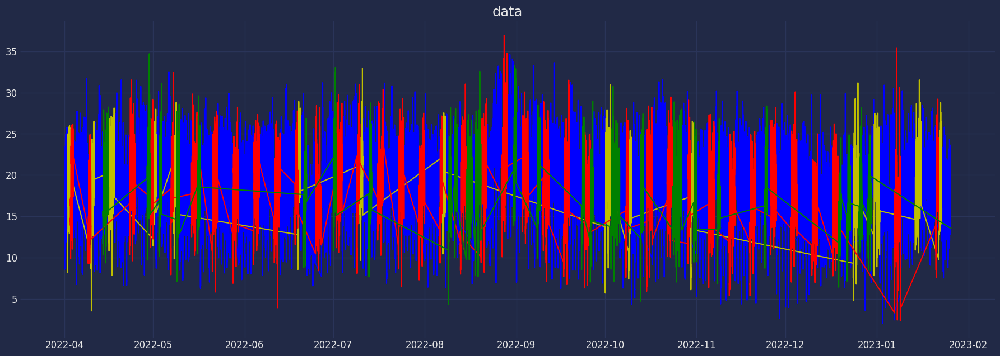

In [98]:
 
plot_figure(load_df.iloc[:96*300], 'data')